# Homework 3

In this homework, you will test various time series classification methods. You must choose **three** datasets from [the UCR/UEA time series repository](http://timeseriesclassification.com) and perform the tasks by evaluating the models on three selected datasets.

Note that the questions are not 100% the same as the lab tasks. Please carefully read all descriptions. Compared to previous homework, there is no fixed answer, and we will evaluate your assignment based on your trials rather than the results. When the description does not specify or restrict things during your implementation process, you can choose your way freely. We will always grade based on the written description on each task only.


### Task 0: Preparation

You need to choose **three** datasets from the UCR/UEA time series repository. Please be careful since some UCR datasets can take a long time to be processed - You do not need to choose heavy datasets since it would slow your training/testing process. Use sktime's `load_UCR_UEA_dataset` function to perform. Please note that **you should use each dataset's original train/test splits** to train and report the test scores.

In [27]:
!pip install sktime

Defaulting to user installation because normal site-packages is not writeable


In [28]:
!pip install keras-self-attention

Defaulting to user installation because normal site-packages is not writeable


In [4]:
from sktime.datasets import load_UCR_UEA_dataset
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split,RandomizedSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Dense, SimpleRNN, Conv1D, GRU, Flatten,MaxPooling1D,Input,BatchNormalization, Dropout,Concatenate,Bidirectional,LSTM,ReLU, GlobalAveragePooling1D,GlobalMaxPooling1D
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sktime.classification.deep_learning.tapnet import TapNetClassifier
from sktime.classification.deep_learning.cnn import CNNClassifier
from sktime.transformations.panel.padder import PaddingTransformer
from sktime.classification.compose import SklearnClassifierPipeline
from sktime.transformations.panel.rocket import Rocket,MiniRocket
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from sktime.classification.kernel_based import RocketClassifier




In [5]:
#Load the datasets
X_strawberry_train, y_strawberry_train = load_UCR_UEA_dataset(name="Strawberry", split='train', return_type="numpy3D")
X_strawberry_test, y_strawberry_test = load_UCR_UEA_dataset(name="Strawberry", split='test', return_type="numpy3D")
X_olive_train, y_olive_train = load_UCR_UEA_dataset(name="OliveOil", split='train', return_type="numpy3D")
X_olive_test, y_olive_test = load_UCR_UEA_dataset(name="OliveOil", split='test', return_type="numpy3D")
X_wine_train, y_wine_train = load_UCR_UEA_dataset(name="Wine", split='train', return_type="numpy3D")
X_wine_test, y_wine_test = load_UCR_UEA_dataset(name="Wine", split='test', return_type="numpy3D")

In [118]:
#Check the shape of the datasets
X_strawberry_train.shape, y_strawberry_train.shape, X_olive_train.shape, y_olive_train.shape, X_wine_train.shape, y_wine_train.shape

((613, 1, 235), (613,), (30, 1, 570), (30,), (57, 1, 234), (57,))

<BarContainer object of 2 artists>

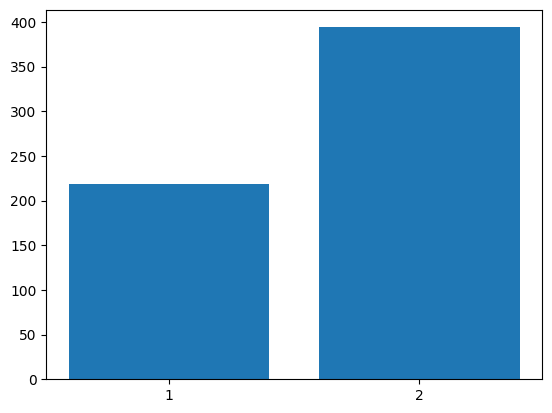

In [119]:
# Checking  the distribution of the classes
plt.bar(np.unique(y_strawberry_train, return_counts = True)[0], np.unique(y_strawberry_train, return_counts = True)[1])

<BarContainer object of 4 artists>

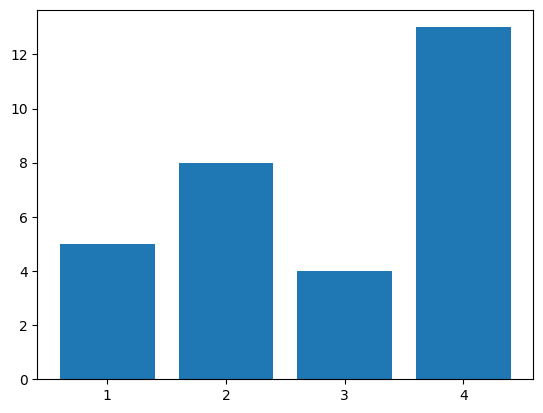

In [120]:
plt.bar(np.unique(y_olive_train, return_counts = True)[0], np.unique(y_olive_train, return_counts = True)[1])

<BarContainer object of 2 artists>

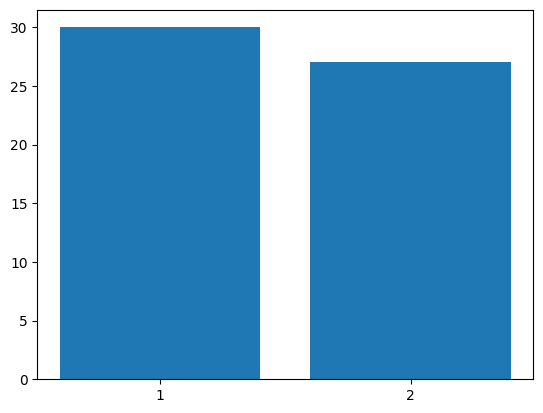

In [121]:
plt.bar(np.unique(y_wine_train, return_counts = True)[0], np.unique(y_wine_train, return_counts = True)[1])

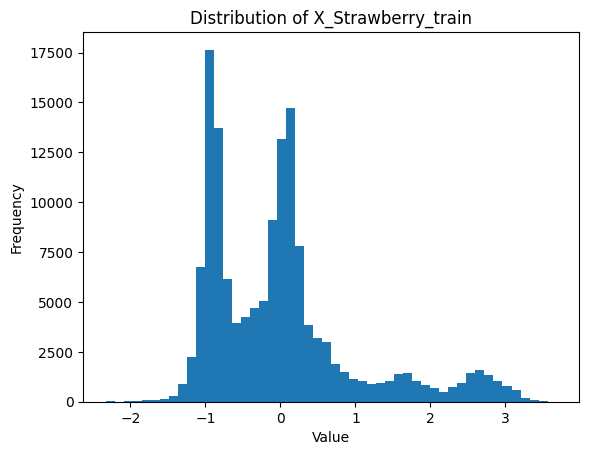

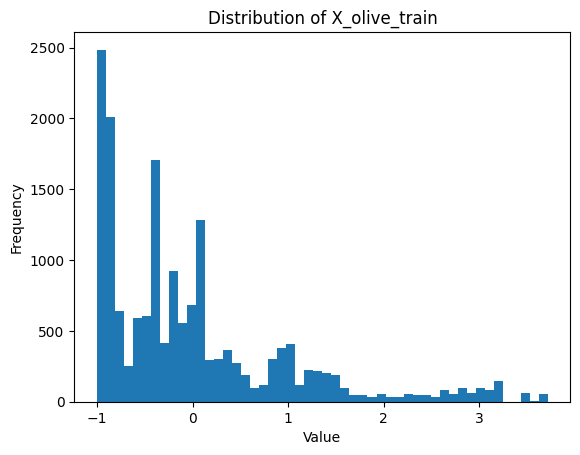

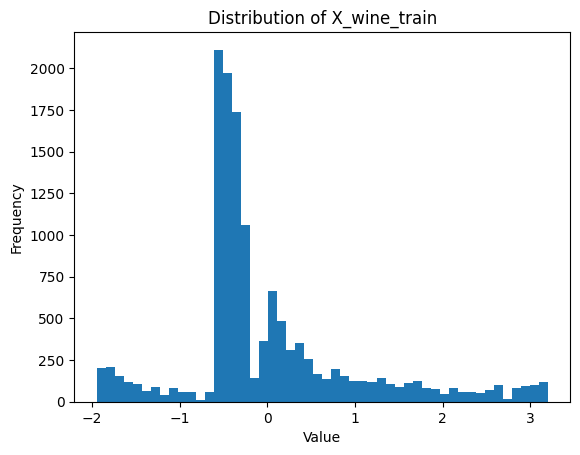

In [122]:


# distribution of X_Strawberry_train
plt.hist(X_strawberry_train.flatten(), bins=50)
plt.title("Distribution of X_Strawberry_train")
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.show()

# distribution of X_olive_train
plt.hist(X_olive_train.flatten(), bins=50)
plt.title("Distribution of X_olive_train")
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.show()

#  distribution of X_wine_train
plt.hist(X_wine_train.flatten(), bins=50)
plt.title("Distribution of X_wine_train")
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.show()
plt.show()


In [123]:
X_strawberry_test.shape, y_strawberry_test.shape, X_olive_test.shape, y_olive_test.shape, X_wine_test.shape, y_wine_test.shape

((370, 1, 235), (370,), (30, 1, 570), (30,), (54, 1, 234), (54,))

In [124]:
# checking labels
np.unique(y_strawberry_train), np.unique(y_olive_train), np.unique(y_wine_train)

(array(['1', '2'], dtype='<U1'),
 array(['1', '2', '3', '4'], dtype='<U1'),
 array(['1', '2'], dtype='<U1'))

### Task 1: Time series classification using deep learning 1



Time series classification problems can be solved using networks like CNN, RNN, or FCN. You can even try to merge different networks. In this task, you must test your three chosen datasets on four other models.

Try to implement four different models: 1) Fully connected network at least with five dense layers, 2) One directional RNN, 3) 1D-CNN only, and 4) 1D-CNN +
GRU. Note that you can always link the network to a fully connected layer to match the output size. You can freely construct any structure you want. Report the average test scores of four models on three datasets you chose. It would be four scores in total. Mark the best model in terms of the average test score. Briefly explain the structure you constructed. There is no definitive answer, and it is up to your own model. Here it would be best if you keep the following rules:

- When initially loading the dataset, use sktime's `load_UCR_UEA_dataset` function. This is for our grading purpose.
- You should use at least **two** Tensorflow callbacks when you fit your model. These can be built-in ones or your personalized callback.
- You should use Tensorflow's data API (`tf.data`) to manage your dataset and use `shuffle`, `batch,` and `prefetch` functions. This means that you need to convert the data format using the `from_tensor_slices` function. This also means that you need to create your own validation set. You are not limited to using any methods to do this, but you may also need to shuffle the dataset before (for that, you can use `np.random.permutation`). If you use Torch, explain how you implement the equivalent operations.
- You need to clearly report the **test accuracy** of the four models. Training and validation accuracy scores are not enough.
- You may need to deal with datasets of different sizes. In this case, it might be helpful to make a function to create a model that can receive different input sizes as a parameter.


In [13]:




def preparation(dataset_name):
    #  Load the dataset
    X_train, y_train = load_UCR_UEA_dataset(name=dataset_name, split="train",return_type="numpy3d")
    X_test, y_test = load_UCR_UEA_dataset(name=dataset_name,split="test",return_type="numpy3d")

    #  Reshape data 
    X_train_reshaped = X_train.reshape(X_train.shape[0], X_train.shape[2], X_train.shape[1])
    X_test_reshaped = X_test.reshape(X_test.shape[0], X_test.shape[2], X_test.shape[1])
    
    
    #  Encode labels
    encoder = LabelEncoder()
    y_train_encoded = encoder.fit_transform(y_train)
    y_test_encoded = encoder.transform(y_test)
    
    
     #  validation set
    X_train_final, X_val, y_train_final, y_val = train_test_split(X_train_reshaped, y_train_encoded, test_size=0.2, random_state=42)
    
    
    #  TensorFlow datasets
    train_dataset = tf.data.Dataset.from_tensor_slices((X_train_final, y_train_final)).shuffle(len(X_train_final)).batch(32).prefetch(tf.data.AUTOTUNE)
    val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val)).batch(32).prefetch(tf.data.AUTOTUNE)

    #  Metadata
    classes = len(np.unique(np.concatenate([y_train_encoded, y_test_encoded])))
    length = X_train_final.shape[1]
    channels = X_train_final.shape[2]
    
    print(X_train_reshaped.shape)
    print(y_train.shape)
    print(X_train_final.shape)
    
    return train_dataset, val_dataset, X_test_reshaped,y_train_final,y_val, y_test_encoded, classes, length, channels


    



In [32]:
X_strawberry_train, X_val_strawberry,X_strawberry_test,y_strawberry_train,y_val_strawberry, y_strawberry_test, classes_strawberry, length_strawberry, channels_strawberry = preparation("Strawberry")
X_olive_train, X_val_olive, X_olive_test, y_olive_train,y_val_olive, y_olive_test, classes_olive, length_olive, channels_olive = preparation("OliveOil")
X_wine_train, X_val_wine, X_wine_test, y_wine_train, y_val_wine, y_wine_test,classes_wine, length_wine, channels_wine = preparation("Wine")

(613, 235, 1)
(613,)
(490, 235, 1)
(30, 570, 1)
(30,)
(24, 570, 1)
(57, 234, 1)
(57,)
(45, 234, 1)


In [43]:
def fcn(X_train, X_val, X_test, y_test, classes, length, channels, dataset):

  # Since I have binary and multiclass classification

  if classes == 2:
    activation = "sigmoid"
    loss = "binary_crossentropy"
  elif classes > 2:
    activation = "softmax"
    loss = "sparse_categorical_crossentropy"


  model = Sequential([
    Flatten(input_shape=(length, channels)),
    Dense(100, activation="relu"),
    Dense(100, activation="relu"),
    Dense(100, activation="relu"),
    Dense(100, activation="relu"),
    Dense(100, activation="relu"),
    Dense(classes, activation=activation)
])

  model.compile(optimizer="adam", loss=loss, metrics=["accuracy"])

  callbacks = [
    EarlyStopping(monitor="val_loss", patience=3,min_delta = 0.001,restore_best_weights=True),
    ModelCheckpoint(filepath=f"best_model_fcn_{dataset}.h5", monitor="val_loss", save_best_only=True)
]

#training

  model.summary()

  history = model.fit(
    X_train,
    epochs=50,
    validation_data=X_val,
    callbacks=callbacks
)
# evaluation
  test_loss, test_acc = model.evaluate(X_test, y_test)
  print(f"Test Accuracy for {dataset}: {test_acc}")

  return test_acc

In [128]:
def rnn(X_train,  X_val, X_test, y_test, classes, length, channels, dataset):
    
    if classes == 2:
        activation = "sigmoid"
        output_units = 1  
        loss = "binary_crossentropy"
    else:
        activation = "softmax"
        output_units = classes  
        loss = "sparse_categorical_crossentropy"

    model = Sequential([
        SimpleRNN(128, input_shape=(length, channels), return_sequences=True),
        SimpleRNN(128, return_sequences=True),
        SimpleRNN(64),
    
        Dense(output_units, activation=activation)
    ])

    model.compile(optimizer="adam", loss=loss, metrics=["accuracy"])

    callbacks = [
        EarlyStopping(monitor="val_loss", patience=5,min_delta = 0.001,restore_best_weights=True),
        ModelCheckpoint(filepath=f"best_model_rnn_{dataset}.h5", monitor="val_loss", save_best_only=True),
    ]

    model.summary()

    history = model.fit(
        X_train, 
        epochs=50,
        validation_data=(X_val),
        callbacks=callbacks
    )

    test_loss, test_acc = model.evaluate(X_test, y_test)
    print(f"Test Accuracy for {dataset}: {test_acc}")

    return test_acc


In [129]:
def cnn(X_train, X_val,  X_test, y_test,  classes, length, channels, dataset):
    
    if classes == 2:
        activation = "sigmoid"
        output_units = 1  
        loss = "binary_crossentropy"
    else:
        activation = "softmax"
        output_units = classes  
        loss = "sparse_categorical_crossentropy"

    model = Sequential([
        Conv1D(128, kernel_size=3, activation="relu", input_shape=(length, channels)),
        MaxPooling1D(2),
        Conv1D(64, kernel_size=3, activation="relu"),
        MaxPooling1D(2),
        Conv1D(64, kernel_size=3, activation="relu"),
        MaxPooling1D(2),
        Conv1D(32, kernel_size=3, activation="relu"),
        MaxPooling1D(2),
        Flatten(),
        Dense(output_units, activation=activation)
    ])

    model.compile(optimizer="adam", loss=loss, metrics=["accuracy"])

    callbacks = [
        EarlyStopping(monitor="val_loss", patience=5,min_delta = 0.001,restore_best_weights=True),
        ModelCheckpoint(filepath=f"best_model_cnn_{dataset}.h5", monitor="val_loss", save_best_only=True),
        
    ]

    model.summary()

    history = model.fit(
        X_train,
        epochs=50,
        validation_data=(X_val),
        callbacks=callbacks
    )

    test_loss, test_acc = model.evaluate(X_test, y_test)
    print(f"Test Accuracy for {dataset}: {test_acc}")

    return test_acc


In [130]:

def cnn_gru(X_train, X_val, X_test, y_test, classes, length, channels, dataset):
    
    if classes == 2:
        activation= "sigmoid"
        output_units = 1  
        loss = "binary_crossentropy"
    else:
        activation = "softmax"
        output_units = classes  
        loss = "sparse_categorical_crossentropy"
    
    model = Sequential([
        Conv1D(128, kernel_size=3, activation="relu", input_shape=(length, channels)),
        MaxPooling1D(2),
        Conv1D(64, kernel_size=3, activation="relu"),
        MaxPooling1D(2),
        Conv1D(64, kernel_size=3, activation="relu"),
        MaxPooling1D(2),
        Conv1D(32, kernel_size=3, activation="relu"),
        MaxPooling1D(2),
        GRU(128),
        BatchNormalization(),
        Flatten(),

        Dense(248, activation="relu"),
        Dropout(0.5), 

    
        Dense(output_units, activation=activation)
])
    model.compile(optimizer="adam", loss=loss, metrics=["accuracy"])

    callbacks = [
        EarlyStopping(monitor="val_loss", patience=5,min_delta = 0.001,restore_best_weights=True),
        ModelCheckpoint(filepath=f"best_model_cnn_gru_{dataset}.h5", monitor="val_loss", save_best_only=True),
        
    ]

    model.summary()

    history = model.fit(
        X_train,
        epochs=50,
        validation_data=(X_val ),
        callbacks=callbacks
    )

    test_loss, test_acc = model.evaluate(X_test, y_test)
    print(f"Test Accuracy for {dataset}: {test_acc}")
    return test_acc
   


In [44]:
# fully connected network
fcn_strawberry = fcn(X_strawberry_train, X_val_strawberry, X_strawberry_test, y_strawberry_test, classes_strawberry, length_strawberry, channels_strawberry, "Strawberry")
fcn_olive = fcn(X_olive_train, X_val_olive, X_olive_test, y_olive_test, classes_olive, length_olive, channels_olive, "OliveOil")
fcn_wine = fcn(X_wine_train, X_val_wine, X_wine_test, y_wine_test, classes_wine, length_wine, channels_wine, "Wine")
# average accuracy
average_fcn = np.mean([fcn_strawberry, fcn_olive, fcn_wine])
print(f"Average Test Accuracy for FCN: {average_fcn}")

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_12 (Flatten)        (None, 235)               0         
                                                                 
 dense_27 (Dense)            (None, 100)               23600     
                                                                 
 dense_28 (Dense)            (None, 100)               10100     
                                                                 
 dense_29 (Dense)            (None, 100)               10100     
                                                                 
 dense_30 (Dense)            (None, 100)               10100     
                                                                 
 dense_31 (Dense)            (None, 100)               10100     
                                                                 
 dense_32 (Dense)            (None, 2)                

In [132]:
#recurrent neural network

rnn_strawberry = rnn(X_strawberry_train, X_val_strawberry, X_strawberry_test, y_strawberry_test, classes_strawberry, length_strawberry, channels_strawberry, "Strawberry")
rnn_olive = rnn(X_olive_train, X_val_olive, X_olive_test, y_olive_test, classes_olive, length_olive, channels_olive, "OliveOil")
rnn_wine = rnn(X_wine_train, X_val_wine, X_wine_test, y_wine_test, classes_wine, length_wine, channels_wine, "Wine")
# average accuracy

average_rnn = np.mean([rnn_strawberry, rnn_olive, rnn_wine])
print(f"Average Test Accuracy for RNN: {average_rnn}")

Model: "sequential_46"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_18 (SimpleRNN)   (None, 235, 128)          16640     
                                                                 
 simple_rnn_19 (SimpleRNN)   (None, 235, 128)          32896     
                                                                 
 simple_rnn_20 (SimpleRNN)   (None, 64)                12352     
                                                                 
 dense_136 (Dense)           (None, 1)                 65        
                                                                 
Total params: 61953 (242.00 KB)
Trainable params: 61953 (242.00 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/50
16/16 [==============================] - 5s 149ms/step - loss: 0.6962 - accuracy: 0.6163 - val_loss: 0.6330 - val_accuracy: 0.6098
Epoch

In [133]:
# convolutional neural network
cnn_strawberry = cnn(X_strawberry_train, X_val_strawberry, X_strawberry_test, y_strawberry_test, classes_strawberry, length_strawberry, channels_strawberry, "Strawberry")
cnn_olive = cnn(X_olive_train, X_val_olive, X_olive_test, y_olive_test, classes_olive, length_olive, channels_olive, "OliveOil")
cnn_wine = cnn(X_wine_train, X_val_wine, X_wine_test, y_wine_test, classes_wine, length_wine, channels_wine, "Wine")
# average accuracy
average_cnn = np.mean([cnn_strawberry, cnn_olive, cnn_wine])
print(f"Average Test Accuracy for CNN: {average_cnn}")

Model: "sequential_49"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_137 (Conv1D)         (None, 233, 128)          512       
                                                                 
 max_pooling1d_86 (MaxPooli  (None, 116, 128)          0         
 ng1D)                                                           
                                                                 
 conv1d_138 (Conv1D)         (None, 114, 64)           24640     
                                                                 
 max_pooling1d_87 (MaxPooli  (None, 57, 64)            0         
 ng1D)                                                           
                                                                 
 conv1d_139 (Conv1D)         (None, 55, 64)            12352     
                                                                 
 max_pooling1d_88 (MaxPooli  (None, 27, 64)          

In [134]:
# convolutional neural network with GRU
cnn_gru_strawberry = cnn_gru(X_strawberry_train, X_val_strawberry, X_strawberry_test, y_strawberry_test, classes_strawberry, length_strawberry, channels_strawberry, "Strawberry")
cnn_gru_olive = cnn_gru(X_olive_train, X_val_olive, X_olive_test, y_olive_test, classes_olive, length_olive, channels_olive, "OliveOil")
cnn_gru_wine = cnn_gru(X_wine_train, X_val_wine, X_wine_test, y_wine_test, classes_wine, length_wine, channels_wine, "Wine")
# average accuracy
average_cnn_gru = np.mean([cnn_gru_strawberry, cnn_gru_olive, cnn_gru_wine])
print(f"Average Test Accuracy for CNN_GRU: {average_cnn_gru}")

Model: "sequential_52"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_149 (Conv1D)         (None, 233, 128)          512       
                                                                 
 max_pooling1d_98 (MaxPooli  (None, 116, 128)          0         
 ng1D)                                                           
                                                                 
 conv1d_150 (Conv1D)         (None, 114, 64)           24640     
                                                                 
 max_pooling1d_99 (MaxPooli  (None, 57, 64)            0         
 ng1D)                                                           
                                                                 
 conv1d_151 (Conv1D)         (None, 55, 64)            12352     
                                                                 
 max_pooling1d_100 (MaxPool  (None, 27, 64)          

### Task 2: Time series classification using deep learning 2

There has been several neural network models dedicated to time series classification. Besides your own models that you developed in Lab 4, now you will develop such dedicated models by referring to some papers, and test if they indeed perform better than your rough models. There are two famous papers as follows:
 - [Convolutional neural networks for time series classification (2017)](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=7870510)
 - [Time Series Classification from Scratch with Deep Neural Networks: A Strong Baseline (2017)](https://arxiv.org/abs/1611.06455)

First paper's idea is already implemented in sktime, with the name `CNNClassifier`. Second paper has three models and those are easy to develop using tensorflow. Now the task is to develop two models (MLP and FCN) in the second paper and test it together with `CNNClassifier`.

Use the same four datasets, and test sktime's `CNNClassifier` and MLP and FCN models you develop. Report test scores of three models (`CNNClassifier`, MLP, and FCN) on three datasets you chose. It would be nine scores in total. For MLP and FCN, you may need to satisfy the following requirement:

- You should use at least **two** Tensorflow callbacks when you fit your model. These can be built-in ones or your personalized callback. If you use Torch, explain how you implement the equivalent operations.
- You should run the model at least 10 epochs.
- You can use the same processed datasets in Task 1. For `CNNClassifier`, as you cannot use `tf.Data`, you may put the training set directly.
- For `CNNClassifier`, you can run it with the default parameters or reduce the number of epoch (default is 2000).
- Please use the predefined test dataset to report the test scores.

Note that the main purpose of this task is to check if you can develop a similar network structure with description. If the detail of the specific part (e.g., size of one layer or some custom parameters like epoch) is missing in the paper, you can set it on your own.


In [20]:
def cnn_sktime(X_train, X_val, X_test, y_train, y_val,y_test, dataset):
    #  Reshape data
    X_train_in = X_train.reshape(X_train.shape[0], -1)
    X_val_in = X_val.reshape(X_val.shape[0], -1)
    X_test_in = X_test.reshape(X_test.shape[0], -1)
    
    
    
    classifier = CNNClassifier(n_epochs=50,verbose=True)
    classifier.fit(X_train_in, y_train)
    #  Evaluate the model
    val_acc = accuracy_score(y_val, classifier.predict(X_val_in))
    print(f"Validation Accuracy for {dataset}: {val_acc}")
    
    test_acc = accuracy_score(y_test, classifier.predict(X_test_in))
    print(f"Test Accuracy for {dataset}: {test_acc}")
    return test_acc

In [21]:
def mlp_paper(X_train, X_val, X_test, y_test, classes, length, channels,dataset):
  


  if classes == 2:
        activation = "sigmoid"
        output_units = 1  
        loss = "binary_crossentropy"
  else:
        activation = "softmax"
        output_units = classes  
        loss = "sparse_categorical_crossentropy"

  model = Sequential([
    Dropout(0.1, input_shape=(length, channels)),
    Flatten(),
    Dense(500, activation="relu",),
    Dropout(0.2,),
    Dense(500, activation="relu"),
    Dropout(0.2),
    Dense(500, activation="relu"),
    Dropout(0.3),
    Dense(output_units, activation=activation)
  ])

  model.compile(optimizer="adam", loss=loss, metrics=["accuracy"])

  callbacks = [
    EarlyStopping(monitor="val_loss", patience=5,min_delta = 0.001,restore_best_weights=True),
    ModelCheckpoint(filepath=f"best_model_mlp_{dataset}.h5", monitor="val_loss", save_best_only=True)
  ]

  history = model.fit(X_train,
                            epochs=50,
                            validation_data=X_val,
                            callbacks=callbacks)

  test_loss, test_acc = model.evaluate(X_test, y_test)
  model.summary()
  print(f"Test Accuracy for {dataset}: {test_acc}")
  return test_acc

In [22]:
def fcn_paper(X_train, X_val, X_test, y_test, classes, length, channels, dataset):

  if classes == 2:
        activation = "sigmoid"
        output_units = 1  
        loss = "binary_crossentropy"
  else:
        activation = "softmax"
        output_units = classes  
        loss = "sparse_categorical_crossentropy"



  model = Sequential([

  Conv1D(128,8, input_shape=(length, channels),activation='relu', padding="same"),
  BatchNormalization(),
  ReLU(),
  Conv1D(256,5, activation='relu', padding="same"),
  BatchNormalization(),
  ReLU(),
  Conv1D(128,3, activation='relu', padding="same"),
  BatchNormalization(),
  ReLU(),
  GlobalAveragePooling1D(),
  Dense(output_units, activation=activation),
  ])

  model.compile(optimizer="adam", loss=loss, metrics=["accuracy"])

  callbacks = [
    EarlyStopping(monitor="val_loss", patience=5,min_delta = 0.001,restore_best_weights=True),
    ModelCheckpoint(filepath=f"best_model_fcn_{dataset}.h5", monitor="val_loss", save_best_only=True)
  ]

  history = model.fit(X_train,
                            epochs=50,
                            validation_data=X_val,
                            callbacks=callbacks)

  test_loss, test_acc = model.evaluate(X_test, y_test)
  model.summary()
  print(f"Test Accuracy for {dataset}: {test_acc}")
  return test_acc

In [10]:
def preprocess_cnn_sktime(dataset_name):
    

    #  Load data

    X_train, y_train = load_UCR_UEA_dataset(name=dataset_name, split="train", return_type="numpy3d")
    X_test, y_test = load_UCR_UEA_dataset(name=dataset_name, split="test", return_type="numpy3d")

    #  Reshape data

    X_train_reshaped = X_train.reshape(X_train.shape[0], X_train.shape[2], X_train.shape[1])
    X_test_reshaped = X_test.reshape(X_test.shape[0], X_test.shape[2], X_test.shape[1])
    print(X_train_reshaped.shape)
    print(y_train.shape)

    #  Encode labels
    encoder = LabelEncoder()
    y_train_encoded = encoder.fit_transform(y_train)
    y_test_encoded = encoder.transform(y_test)
    
    
     # Create a validation set
    X_train_final, X_val, y_train_final, y_val = train_test_split(X_train_reshaped, y_train_encoded, test_size=0.2, random_state=42)

    return X_train_final, X_val, X_test_reshaped, y_train_final, y_val, y_test_encoded

In [23]:
# Preprocess sktime CNN datasets

X_strawberry_sktime_train, X_val_sktime_strawberry, X_test_sktime_strawberry ,y_train_sktime_strawberry, y_val_sktime_strawberry, y_test_sktime_strawberry = preprocess_cnn_sktime("Strawberry")
X_olive_sktime_train, X_val_sktime_olive, X_test_sktime_olive, y_train_sktime_olive, y_val_sktime_olive, y_test_sktime_olive = preprocess_cnn_sktime("OliveOil")
X_wine_sktime_train, X_val_sktime_wine, X_test_sktime_wine, y_train_sktime_wine, y_val_sktime_wine, y_test_sktime_wine = preprocess_cnn_sktime("Wine")


(613, 235, 1)
(613,)
(30, 570, 1)
(30,)
(57, 234, 1)
(57,)


In [19]:
# CNN_sktime

cnn_sktime_strawberry=cnn_sktime(X_strawberry_sktime_train, X_val_sktime_strawberry, X_test_sktime_strawberry ,y_train_sktime_strawberry, y_val_sktime_strawberry, y_test_sktime_strawberry, "Strawberry")
cnn_sktime_olive= cnn_sktime(X_olive_sktime_train, X_val_sktime_olive, X_test_sktime_olive, y_train_sktime_olive, y_val_sktime_olive, y_test_sktime_olive , "OliveOil")
cnn_sktime_wine = cnn_sktime(X_wine_sktime_train, X_val_sktime_wine, X_test_sktime_wine, y_train_sktime_wine, y_val_sktime_wine, y_test_sktime_wine, "Wine")

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 235, 1)]          0         
                                                                 
 conv1d_6 (Conv1D)           (None, 229, 6)            48        
                                                                 
 average_pooling1d_6 (Avera  (None, 76, 6)             0         
 gePooling1D)                                                    
                                                                 
 conv1d_7 (Conv1D)           (None, 70, 12)            516       
                                                                 
 average_pooling1d_7 (Avera  (None, 23, 12)            0         
 gePooling1D)                                                    
                                                                 
 flatten_3 (Flatten)         (None, 276)               0   

In [33]:
#MLP
mlp_paper_strawberry = mlp_paper(X_strawberry_train, X_val_strawberry, X_strawberry_test, y_strawberry_test, classes_strawberry, length_strawberry, channels_strawberry, "Strawberry")
mlp_paper_olive = mlp_paper(X_olive_train, X_val_olive, X_olive_test, y_olive_test, classes_olive, length_olive, channels_olive, "OliveOil")
mlp_paper_wine = mlp_paper(X_wine_train, X_val_wine, X_wine_test, y_wine_test, classes_wine, length_wine, channels_wine, "Wine")


Epoch 1/50
16/16 [==============================] - 1s 19ms/step - loss: 0.6797 - accuracy: 0.6204 - val_loss: 0.6147 - val_accuracy: 0.6748
Epoch 2/50
16/16 [==============================] - 0s 9ms/step - loss: 0.6168 - accuracy: 0.6143 - val_loss: 0.5533 - val_accuracy: 0.6341
Epoch 3/50
 1/16 [>.............................] - ETA: 0s - loss: 0.5350 - accuracy: 0.7188

C:\Users\glout\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


16/16 [==============================] - 0s 8ms/step - loss: 0.5533 - accuracy: 0.7020 - val_loss: 0.5693 - val_accuracy: 0.6423
Epoch 4/50
16/16 [==============================] - 0s 10ms/step - loss: 0.5062 - accuracy: 0.7286 - val_loss: 0.4550 - val_accuracy: 0.8618
Epoch 5/50
16/16 [==============================] - 0s 10ms/step - loss: 0.4897 - accuracy: 0.7408 - val_loss: 0.4260 - val_accuracy: 0.8374
Epoch 6/50
16/16 [==============================] - 0s 8ms/step - loss: 0.4598 - accuracy: 0.7735 - val_loss: 0.4443 - val_accuracy: 0.7561
Epoch 7/50
16/16 [==============================] - 0s 10ms/step - loss: 0.4088 - accuracy: 0.7959 - val_loss: 0.3536 - val_accuracy: 0.8862
Epoch 8/50
16/16 [==============================] - 0s 10ms/step - loss: 0.4572 - accuracy: 0.7837 - val_loss: 0.3379 - val_accuracy: 0.8699
Epoch 9/50
16/16 [==============================] - 0s 8ms/step - loss: 0.4443 - accuracy: 0.7898 - val_loss: 0.3551 - val_accuracy: 0.8780
Epoch 10/50
16/16 [========

In [34]:
# FCN Paper
fcn_paper_strawberry = fcn_paper(X_strawberry_train, X_val_strawberry, X_strawberry_test, y_strawberry_test, classes_strawberry, length_strawberry, channels_strawberry, "Strawberry")
fcn_paper_olive = fcn_paper(X_olive_train, X_val_olive, X_olive_test, y_olive_test, classes_olive, length_olive, channels_olive, "OliveOil")
fcn_paper_wine = fcn_paper(X_wine_train, X_val_wine, X_wine_test, y_wine_test, classes_wine, length_wine, channels_wine, "Wine")

Epoch 1/50
16/16 [==============================] - 3s 84ms/step - loss: 0.5424 - accuracy: 0.7061 - val_loss: 0.7060 - val_accuracy: 0.3902
Epoch 2/50
16/16 [==============================] - 1s 71ms/step - loss: 0.4107 - accuracy: 0.8673 - val_loss: 0.6997 - val_accuracy: 0.3902
Epoch 3/50
16/16 [==============================] - 1s 71ms/step - loss: 0.3141 - accuracy: 0.9102 - val_loss: 0.6952 - val_accuracy: 0.3902
Epoch 4/50
16/16 [==============================] - 1s 73ms/step - loss: 0.2504 - accuracy: 0.9388 - val_loss: 0.6945 - val_accuracy: 0.3902
Epoch 5/50
16/16 [==============================] - 1s 72ms/step - loss: 0.2567 - accuracy: 0.9224 - val_loss: 0.6936 - val_accuracy: 0.3902
Epoch 6/50
16/16 [==============================] - 1s 81ms/step - loss: 0.2164 - accuracy: 0.9429 - val_loss: 0.6934 - val_accuracy: 0.3902
Epoch 7/50
16/16 [==============================] - 1s 74ms/step - loss: 0.1839 - accuracy: 0.9408 - val_loss: 0.6943 - val_accuracy: 0.3902
Epoch 8/50
16

### Task 3: Time series classification using deep learning 3

Next, you can try to further improve your model by selecting **two** of the following ideas:
- Use Bi-Direction LSTM and CNN networks separately, create two to three layers individually, and concatenate them. This means that until the third (or second) layer, you have two different networks handling the same dataset, and after that, you concatenate the output and finish with any FCN layer. Check [this post](https://stackoverflow.com/questions/59168306/how-to-combine-lstm-and-cnn-in-timeseries-classification) to get inspired.
- Apply any sktime's transformer (not attention transformer) first to the dataset and run any deep learning model you already developed in Tasks 2 and 3. In this case, you need to choose at least two transformers and apply them together.
- Train the model on multiple similar datasets and test it on one specific test set. Check if the model can be improved if it is trained on multiple datasets (at least five datasets). However, for this, you also need to choose the similar datasets based on their classification and motivate your choise in the report (UCR repository has a specific dataset type such as **AUDIO** or **MOTION**). You could try to crop or pad the time series if you would like to match the sizes.

Choose one model you want from the models you have developed in Tasks 1 and 2. Select one idea, try implementing it, and check if you can improve the performance. Note that you do not need to prove that the accuracy scores increase but must explain your trials. Report test scores on three datasets you chose.

In [171]:


def bi_lstm_cnn(X_train, X_val, X_test, y_train, y_val, y_test, classes, length, channels, dataset):
    if classes == 2:
        activation = "sigmoid"
        output_units = 1 
        loss = "binary_crossentropy"
    else:
        activation = "softmax"
        output_units = classes  
        loss = "sparse_categorical_crossentropy"

    #  input shape
    input_shape = (length, channels)

    # input layers
    lstm_input = Input(shape=input_shape, name="lstm_input")
    cnn_input = Input(shape=input_shape, name="cnn_input")

    # Bi-LSTM 
    lstm_out = Bidirectional(LSTM(100, return_sequences=True))(lstm_input)
    lstm_out = Bidirectional(LSTM(50, return_sequences=True))(lstm_out)
    lstm_out = Bidirectional(LSTM(25))(lstm_out)  

    # CNN 
    cnn_out = Conv1D(200, kernel_size=3, activation="relu", padding="same")(cnn_input)
    cnn_out = Conv1D(100, kernel_size=3, activation="relu", padding="same")(cnn_out)
    cnn_out = Conv1D(50, kernel_size=3, activation="relu", padding="same")(cnn_out)
    cnn_out = GlobalMaxPooling1D()(cnn_out)

    # Concatenation of  the outputs of the two paths
    merged = Concatenate()([lstm_out, cnn_out])

    # Fully connected layers
    dense_out = Dense(100, activation="relu")(merged)
    final_output = Dense(output_units, activation=activation)(dense_out)

    model = Model(inputs=[lstm_input, cnn_input], outputs=final_output)
    model.compile(optimizer="adam", loss=loss, metrics=["accuracy"])

    
    callbacks = [
        EarlyStopping(monitor="val_loss", patience=3),
        ModelCheckpoint(filepath=f"best_model_{dataset}.h5", monitor="val_loss", save_best_only=True)
    ]

    
    history = model.fit([X_train, X_train], y_train, validation_data=([X_val, X_val], y_val), epochs=50, batch_size=32, callbacks=callbacks)

    
    test_loss, test_acc = model.evaluate([X_test, X_test], y_test)
    model.summary()
    print(f"Test Accuracy for {dataset}: {test_acc}")
    return test_acc


In [172]:
def preprocess_bi_lstm_cnn(dataset_name):
    
    X_train, y_train = load_UCR_UEA_dataset(name=dataset_name, split="train", return_type="numpy3d")
    X_test, y_test = load_UCR_UEA_dataset(name=dataset_name, split="test", return_type="numpy3d")

   
    X_train = X_train.reshape(X_train.shape[0], X_train.shape[2], X_train.shape[1])
    X_test = X_test.reshape(X_test.shape[0], X_test.shape[2], X_test.shape[1])

   
    encoder = LabelEncoder()
    y_train = encoder.fit_transform(y_train)
    y_test = encoder.transform(y_test)

   
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

    
    classes = len(np.unique(np.concatenate([y_train, y_test])))
    length = X_train.shape[1]
    channels = X_train.shape[2]

    return X_train, X_val, X_test, y_train, y_val, y_test, classes, length, channels

In [173]:
# preprocessing bi-lstm-cnn datasets
X_strawberry_train, X_val_strawberry,X_strawberry_test,y_strawberry_train,y_val_strawberry, y_strawberry_test, classes_strawberry, length_strawberry, channels_strawberry = preprocess_bi_lstm_cnn("Strawberry")
X_olive_train, X_val_olive, X_olive_test, y_olive_train,y_val_olive, y_olive_test, classes_olive, length_olive, channels_olive = preprocess_bi_lstm_cnn("OliveOil")
X_wine_train, X_val_wine, X_wine_test, y_wine_train, y_val_wine, y_wine_test,classes_wine, length_wine, channels_wine = preprocess_bi_lstm_cnn("Wine")

In [174]:
# Bi-LSTM-CNN results
lstm_cnn_strawberry = bi_lstm_cnn(X_strawberry_train, X_val_strawberry, X_strawberry_test, y_strawberry_train,y_val_strawberry,y_strawberry_test, classes_strawberry, length_strawberry, channels_strawberry, "Strawberry")
lstm_cnn_olive = bi_lstm_cnn(X_olive_train, X_val_olive, X_olive_test,y_olive_train,y_val_olive, y_olive_test, classes_olive, length_olive, channels_olive, "OliveOil")
lstm_cnn_wine = bi_lstm_cnn(X_wine_train, X_val_wine, X_wine_test,y_wine_train,y_val_wine, y_wine_test, classes_wine, length_wine, channels_wine, "Wine")

average_lstm_cnn = np.mean([lstm_cnn_strawberry, lstm_cnn_olive, lstm_cnn_wine])
print(f"Average Test Accuracy for Bidirectional LSTM CNN: {average_lstm_cnn}")

Epoch 1/50
16/16 [==============================] - 13s 351ms/step - loss: 0.6519 - accuracy: 0.6429 - val_loss: 0.6614 - val_accuracy: 0.6098
Epoch 2/50


C:\Users\glout\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


16/16 [==============================] - 4s 241ms/step - loss: 0.6228 - accuracy: 0.6510 - val_loss: 0.6335 - val_accuracy: 0.6098
Epoch 3/50
16/16 [==============================] - 4s 251ms/step - loss: 0.5981 - accuracy: 0.6224 - val_loss: 0.6291 - val_accuracy: 0.6341
Epoch 4/50
16/16 [==============================] - 4s 260ms/step - loss: 0.5868 - accuracy: 0.6531 - val_loss: 0.5965 - val_accuracy: 0.6098
Epoch 5/50
16/16 [==============================] - 4s 259ms/step - loss: 0.5811 - accuracy: 0.6449 - val_loss: 0.5644 - val_accuracy: 0.6098
Epoch 6/50
16/16 [==============================] - 5s 285ms/step - loss: 0.5343 - accuracy: 0.6878 - val_loss: 0.5511 - val_accuracy: 0.6667
Epoch 7/50
16/16 [==============================] - 5s 329ms/step - loss: 0.5403 - accuracy: 0.6898 - val_loss: 0.5336 - val_accuracy: 0.6829
Epoch 8/50
16/16 [==============================] - 5s 325ms/step - loss: 0.5075 - accuracy: 0.7286 - val_loss: 0.4822 - val_accuracy: 0.7561
Epoch 9/50
16/16 

In [147]:


def apply_transformers(X_train, X_test):
    # Initialize transformers
    rocket = Rocket()
    minirocket= MiniRocket()

    # Create a pipeline
    pipeline = Pipeline([
        ("rocket", rocket),
        ("minirocket", minirocket)
    ])

    # Fit and transform the training data
    X_train_transformed = pipeline.fit_transform(X_train)

    # Transform the test data
    X_test_transformed = pipeline.transform(X_test)

    return X_train_transformed, X_test_transformed


In [152]:


def preprocess_transformers(dataset_name):
    # Load the dataset 
    X_train, y_train = load_UCR_UEA_dataset(name=dataset_name, split="train", return_type="numpy3d")
    X_test, y_test = load_UCR_UEA_dataset(name=dataset_name, split="test", return_type="numpy3d")

    # Reshape data
    X_train_reshaped = X_train.reshape(X_train.shape[0], X_train.shape[2], X_train.shape[1])
    X_test_reshaped = X_test.reshape(X_test.shape[0], X_test.shape[2], X_test.shape[1])

    # Encode labels
    encoder = LabelEncoder()
    y_train_encoded = encoder.fit_transform(y_train)
    y_test_encoded = encoder.transform(y_test)
    
    
    padding = PaddingTransformer(pad_length=9, fill_value=0)

    X_train = padding.fit_transform(X_train_reshaped)
    X_test = padding.transform(X_test_reshaped)

     #Initialize transformers
    rocket = Rocket()
    mini_rocket = MiniRocket() 

    
    X_train_reshaped = X_train.reshape(X_train.shape[0],X_train.shape[2],X_train.shape[1])
    X_test_reshaped = X_test.reshape(X_test.shape[0],X_test.shape[2],X_test.shape[1])

    # Transform data
    X_train_rocket = rocket.fit_transform(X_train_reshaped)
    X_test_rocket = rocket.transform(X_test_reshaped)
    X_train_minirocket = mini_rocket.fit_transform(X_train_reshaped)
    X_test_minirocket = mini_rocket.transform(X_test_reshaped)

    # Combine features from both transformers
    X_train_combined = np.concatenate((X_train_rocket, X_train_minirocket), axis=1)
    X_test_combined = np.concatenate((X_test_rocket, X_test_minirocket), axis=1)


    # Create a validation set from the combined features
    X_train_final, X_val, y_train_final, y_val = train_test_split(X_train_combined, y_train_encoded, test_size=0.2, random_state=42)
    
    # Create TensorFlow datasets for training with your deep learning models
    train_dataset = tf.data.Dataset.from_tensor_slices((X_train_final, y_train_final)).shuffle(len(X_train_final)).batch(32).prefetch(tf.data.AUTOTUNE)
    val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val)).batch(32).prefetch(tf.data.AUTOTUNE)

    # Metadata
 
    classes = len(np.unique(np.concatenate([y_train_encoded, y_test_encoded])))
    length = X_train_final.shape[1]  
    channels = 1  
   
    

    return train_dataset, val_dataset, X_test_combined, y_train_final, y_val, y_test_encoded, classes, length, channels


   
    
    
    

In [153]:
# Preprocess Rocket Minirocket datasets

X_train_rocket_strawberry, X_val_rocket_strawberry, X_test_rocket_strawberry, y_train_rocket_strawberry, y_val_rocket_strawberry,y_test_rocket_strawberry, classes_rocket_strawberry, length_rocket_strawbery, channels_rocket_strawberry = preprocess_transformers("Strawberry")
X_train_rocket_olive, X_val_rocket_olive, X_test_rocket_olive,y_train_rocket_olive, y_val_rocket_olive ,y_test_rocket_olive, classes_rocket_olive,length_rocket_olive,channels_rocket_olive = preprocess_transformers("OliveOil")
X_train_rocket_wine, X_val_rocket_wine, X_test_rocket_wine, y_train_rocket_wine, y_val_rocket_wine, y_test_rocket_wine, classes_rocket_wine,length_rocket_wine, channels_rocket_wine = preprocess_transformers("Wine")


In [154]:
# Fully connected network with transformers
fcn_tranformers_strawberry = fcn(X_train_rocket_strawberry, X_val_rocket_strawberry, X_test_rocket_strawberry, y_test_rocket_strawberry, classes_rocket_strawberry, length_rocket_strawbery, channels_rocket_strawberry, "Strawberry")
fcn_tranformers_olive = fcn(X_train_rocket_olive, X_val_rocket_olive, X_test_rocket_olive, y_test_rocket_olive, classes_rocket_olive, length_rocket_olive, channels_rocket_olive, "OliveOil")
fcn_tranformers_wine = fcn(X_train_rocket_wine, X_val_rocket_wine, X_test_rocket_wine, y_test_rocket_wine, classes_rocket_wine, length_rocket_wine, channels_rocket_wine, "Wine")

Model: "sequential_61"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_56 (Flatten)        (None, 109964)            0         
                                                                 
 dense_172 (Dense)           (None, 100)               10996500  
                                                                 
 dense_173 (Dense)           (None, 100)               10100     
                                                                 
 dense_174 (Dense)           (None, 100)               10100     
                                                                 
 dense_175 (Dense)           (None, 100)               10100     
                                                                 
 dense_176 (Dense)           (None, 100)               10100     
                                                                 
 dense_177 (Dense)           (None, 2)               

C:\Users\glout\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


16/16 [==============================] - 3s 119ms/step - loss: 15.8568 - accuracy: 0.5163 - val_loss: 6.3956 - val_accuracy: 0.6098
Epoch 2/50
16/16 [==============================] - 2s 107ms/step - loss: 6.9960 - accuracy: 0.5449 - val_loss: 1.7892 - val_accuracy: 0.6098
Epoch 3/50
16/16 [==============================] - 1s 88ms/step - loss: 2.5106 - accuracy: 0.6184 - val_loss: 8.3525 - val_accuracy: 0.3902
Epoch 4/50
16/16 [==============================] - 1s 87ms/step - loss: 5.0943 - accuracy: 0.5184 - val_loss: 1.8768 - val_accuracy: 0.6098
Epoch 5/50
16/16 [==============================] - 2s 105ms/step - loss: 1.5477 - accuracy: 0.6143 - val_loss: 0.6577 - val_accuracy: 0.6260
Epoch 6/50
16/16 [==============================] - 2s 105ms/step - loss: 0.5942 - accuracy: 0.7020 - val_loss: 0.4596 - val_accuracy: 0.7724
Epoch 7/50
16/16 [==============================] - 1s 87ms/step - loss: 0.5021 - accuracy: 0.7551 - val_loss: 0.9365 - val_accuracy: 0.6098
Epoch 8/50
16/16 [=

In [39]:
def improve_cnn(X_train, X_val, X_test, y_test, classes, length, channels, dataset):
    if classes == 2:
        activation = "sigmoid"
        output_units = 1  
        loss = "binary_crossentropy"
    else:
        activation = "softmax"
        output_units = classes  
        loss = "sparse_categorical_crossentropy"

    model = Sequential([
       
        Conv1D(128, kernel_size=3, input_shape=(length, channels), activation="relu"),
        BatchNormalization(),
        MaxPooling1D(2),
        Dropout(0.25),

        Conv1D(64, kernel_size=3, activation="relu"),
        BatchNormalization(),
        MaxPooling1D(2),
        Dropout(0.25),
        
        Conv1D(64, kernel_size=3, activation="relu"),  
        BatchNormalization(),
        MaxPooling1D(2),
        Dropout(0.25),
    
        Conv1D(32, kernel_size=3, activation="relu"),
        BatchNormalization(),
        MaxPooling1D(2),
        

        Flatten(),

        Dense(16, activation="relu"),  
        Dropout(0.5),

        Dense(output_units, activation=activation)  
    ])

    model.compile(optimizer="adam", loss=loss, metrics=["accuracy"])

    callbacks = [
        EarlyStopping(monitor="val_loss", patience=3),
        ModelCheckpoint(filepath=f"best_model_cnn_{dataset}.h5", monitor="val_loss", save_best_only=True),
    ]

    model.summary()

    history = model.fit(
        X_train,
        epochs=50,
        validation_data=(X_val),
        callbacks=callbacks
    )

    test_loss, test_acc = model.evaluate(X_test, y_test)
    print(f"Test Accuracy for {dataset}: {test_acc}")

    return test_acc

In [40]:
# preprocessing improve cnn
X_strawberry_train, X_val_strawberry,X_strawberry_test,y_strawberry_train,y_val_strawberry, y_strawberry_test, classes_strawberry, length_strawberry, channels_strawberry = preparation("Strawberry")
X_olive_train, X_val_olive, X_olive_test, y_olive_train,y_val_olive, y_olive_test, classes_olive, length_olive, channels_olive = preparation("OliveOil")
X_wine_train, X_val_wine, X_wine_test, y_wine_train, y_val_wine, y_wine_test,classes_wine, length_wine, channels_wine = preparation("Wine")

(613, 235, 1)
(613,)
(490, 235, 1)
(30, 570, 1)
(30,)
(24, 570, 1)
(57, 234, 1)
(57,)
(45, 234, 1)


In [41]:
# improved CNN model results
impr_cnn_strawberry = improve_cnn(X_strawberry_train, X_val_strawberry, X_strawberry_test, y_strawberry_test, classes_strawberry, length_strawberry, channels_strawberry, "Strawberry")
impr_cnn_olive = improve_cnn(X_olive_train, X_val_olive, X_olive_test, y_olive_test, classes_olive, length_olive, channels_olive, "OliveOil")
impr_cnn_wine = improve_cnn(X_wine_train, X_val_wine, X_wine_test, y_wine_test, classes_wine, length_wine, channels_wine, "Wine")

average_cnn = np.mean([impr_cnn_strawberry, impr_cnn_olive, impr_cnn_wine])
print(f"Average Test Accuracy for improved CNN: {average_cnn}")

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_21 (Conv1D)          (None, 233, 128)          512       
                                                                 
 batch_normalization_9 (Bat  (None, 233, 128)          512       
 chNormalization)                                                
                                                                 
 max_pooling1d (MaxPooling1  (None, 116, 128)          0         
 D)                                                              
                                                                 
 dropout_12 (Dropout)        (None, 116, 128)          0         
                                                                 
 conv1d_22 (Conv1D)          (None, 114, 64)           24640     
                                                                 
 batch_normalization_10 (Ba  (None, 114, 64)          

C:\Users\glout\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


16/16 [==============================] - 1s 40ms/step - loss: 0.6705 - accuracy: 0.6510 - val_loss: 0.6885 - val_accuracy: 0.6098
Epoch 3/50
16/16 [==============================] - 1s 34ms/step - loss: 0.6553 - accuracy: 0.6490 - val_loss: 0.6861 - val_accuracy: 0.6098
Epoch 4/50
16/16 [==============================] - 1s 32ms/step - loss: 0.6210 - accuracy: 0.6510 - val_loss: 0.6824 - val_accuracy: 0.6098
Epoch 5/50
16/16 [==============================] - 1s 33ms/step - loss: 0.6053 - accuracy: 0.6510 - val_loss: 0.6785 - val_accuracy: 0.6098
Epoch 6/50
16/16 [==============================] - 1s 33ms/step - loss: 0.5713 - accuracy: 0.6469 - val_loss: 0.6747 - val_accuracy: 0.6098
Epoch 7/50
16/16 [==============================] - 0s 29ms/step - loss: 0.5962 - accuracy: 0.6490 - val_loss: 0.6776 - val_accuracy: 0.6098
Epoch 8/50
16/16 [==============================] - 0s 29ms/step - loss: 0.5910 - accuracy: 0.6449 - val_loss: 0.6775 - val_accuracy: 0.6098
Epoch 9/50
16/16 [======

### Task 4: Time series classification using sktime

We can use RandomizedSearch to find optimal parameter options on pipelines. However, sktime's pipeline does not support scikit-learn's classifiers such as DecisionTree or RandomForest well. However, sometimes we would like to use the output of the sktime transformer (e.g., catch22) to train scikit-learn models such as RandomForest. Sktime supports this with `SklearnClassifierPipeline` to put a  scikit-learn classifier and sktime's transformer together and you need to implement it.

Pick one classifier from scikit-learn (that can be anything! e.g., Decision Tree or Logistic Regressor) and two transformers from sktime and create `SklearnClassifierPipeline.` As we tried in this lab, that can be **Rocket with RandomForest** or **Catch22 with DecisionTree**. Pick one parameter from each module (in total, three, one from the classifier and two from two transformers) and run a randomized search on the pipeline you define and report the test score of the best model found by the randomized Search. Compare your best score to the score from the same model with the default setting.

Task 4 involves a time-consuming process, so you can only choose **one dataset** to perform the task above. Also, note that you do not need to perform better by conducting a randomized search for this task (but still good to try!).

In [1]:


def random_search(X_train, X_test, y_train,y_test ):
    
    
    # Define names for  classifier/transformers
    classifier = DecisionTreeClassifier()

    padding_transformer = PaddingTransformer(fill_value=0) 
    rocket_transformer = Rocket()  

    ##  SklearnClassifierPipeline

    pip = SklearnClassifierPipeline(classifier,[("padding_transformer",padding_transformer),("rocket_transformer",rocket_transformer)])
    
    

    # parameters for tuning
    parameters = {
        "classifier__max_depth": [1, 10,20],  
        "rocket_transformer__num_kernels": [50, 100, 150],
        "padding_transformer__pad_length": [9,12,15],
    }
    
    rndm_search = RandomizedSearchCV(pip, param_distributions=parameters, n_iter=5, cv=5, verbose=True)
    rndm_search.fit(X_train, y_train)
    
    
    #  score with default parameters
    print("Score with default parameters: ", pip.fit(X_train,y_train).score(X_test, y_test))
    
    # best score and best parameters
    print("Best score: ", rndm_search.best_score_)
    print("Best parameters: ", rndm_search.best_params_)
    
    

In [2]:
def preprocess_rndm(dataset_name):

    X_train,y_train= load_UCR_UEA_dataset(name=dataset_name, split="train", return_type="numpy3d")
    X_test,y_test= load_UCR_UEA_dataset(name=dataset_name, split="test", return_type="numpy3d")
    
    
    X_train_reshaped = X_train.reshape(X_train.shape[0], X_train.shape[2], X_train.shape[1])
    X_test_reshaped = X_test.reshape(X_test.shape[0], X_test.shape[2], X_test.shape[1])
    
    
    encoder= LabelEncoder()
    y_train_encoded = encoder.fit_transform(y_train)
    y_test_encoded = encoder.transform(y_test)
    
    
    return X_train_reshaped, X_test_reshaped, y_train_encoded, y_test_encoded

In [6]:
X_train_rndm_strawberry, X_test_rndm_strawberry, y_train_rndm_strawberry, y_test_rndm_strawberry = preprocess_rndm("Strawberry")

In [7]:
Random_search_strawberry = random_search(X_train_rndm_strawberry, X_test_rndm_strawberry, y_train_rndm_strawberry, y_test_rndm_strawberry)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


C:\Users\glout\AppData\Roaming\Python\Python311\site-packages\sktime\datatypes\_panel\_convert.py:760: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  x_nested[_label] = pd.Series(dim_list)
C:\Users\glout\AppData\Roaming\Python\Python311\site-packages\sktime\datatypes\_panel\_convert.py:760: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  x_nested[_label] = pd.Series(dim_list)
C:\Users\glout\AppData\Roaming\Python\Python311\site-packages\sktime\datatypes\_panel\_convert.py:760: PerformanceWarning: DataFrame is highly fragmented.  Th

Score with default parameters:  0.6432432432432432
Best score:  0.8924163667866185
Best parameters:  {'rocket_transformer__num_kernels': 150, 'padding_transformer__pad_length': 9, 'classifier__max_depth': 20}


### Task 5: Multivariate time series classification

Time series can be **multivariate**, which means there can be many values (= data points) describing one time point. In this task, you will use one **multivariate** dataset (**Eplipsy**) and try to run one deep learning model and one sktime model to see if those models work well on multivariate time series.

- Use Eplipsy dataset in the UCR/UEA repository.
- Run two classifiers of your choice in sktime, such as TapNet, Rocket, or MiniRocket, together with **the best tensorflow deep learning model from the previous tasks** on Eplipsy. You need to adjust the deep learning model's input layer to handle this multivariate dataset.
- Use sktime's `load_UCR_UEA_dataset` function to perform. You should use each dataset's original train/test splits.
- For the deep learning model, you should transform it using TensorFlow data API (`tf.data`) to manage your dataset and use `shuffle`, `batch`, and `prefetch` functions. This means that you need to create the validation set first. If you use Torch, explain how you implement the equivalent operations.
- For training, you need to run at least 10 epochs for your deep learning model. For TapNet, you can keep the default parameter options.
- Report the test scores of three models on the predefined test set.
- **Do the same task on one more chosen multivariate time series dataset.**

In [1]:
def tapnet (X_train,  X_test, y_train , y_test,dataset_name):
    
    tapnet = TapNetClassifier()
    tapnet.fit(X_train, y_train)
    
    #  Evaluate the model
    
    test_acc = accuracy_score(y_test, tapnet.predict(X_test))
    print("Test Accuracy for " ,dataset_name, test_acc)
        

In [2]:
def rocket (X_train, X_test, y_train , y_test,dataset_name):
    
    rocket =RocketClassifier()
    rocket.fit(X_train, y_train)
    
    #  Evaluate the model

    test_acc = accuracy_score(y_test, rocket.predict(X_test))
    print("Test Accuracy for " ,dataset_name, test_acc)

In [11]:
# preprocessing epilpsy and basic motion datasets for tapnet and rocket
X_train_epilepsy, X_val_epilepsy, X_test_epilepsy, y_train_epilepsy, y_val_epilepsy, y_test_epilepsy = preprocess_cnn_sktime("Epilepsy")
X_train_BMotions, X_val_BMotions, X_test_BMotions, y_train_BMotions, y_val_BMotions, y_test_BMotions= preprocess_cnn_sktime("BasicMotions")

(137, 206, 3)
(137,)
(40, 100, 6)
(40,)


In [14]:
# Preprocess epilepsy and Basicmotion datasets for  my best classifier CNN

X_train_epilepsy_2, X_val_epilepsy_2, X_test_epilepsy_2, y_train_epilepsy_2, y_val_epilepsy_2, y_test_epilepsy_2, classes_epilepsy_2, length_epilepsy_2, channels_epilepsy_2 = preparation("Epilepsy")
X_train_BMotions_2, X_val_BMotions_2, X_test_BMotions_2, y_train_BMotions_2, y_val_BMotions_2, y_test_BMotions_2, classes_BMotions_2, length_BMotions_2, channels_BMotions_2 = preparation("BasicMotions")

(137, 206, 3)
(137,)
(109, 206, 3)
(40, 100, 6)
(40,)
(32, 100, 6)


In [16]:
# tapnet results
tapnet_epilepsy = tapnet(X_train_epilepsy,  X_test_epilepsy, y_train_epilepsy,  y_test_epilepsy, "Epilepsy")
tapnet_BMotions = tapnet(X_train_BMotions,  X_test_BMotions, y_train_BMotions, y_test_BMotions, "BasicMotions")




9/9 [==============================] - 1s 7ms/step
Test Accuracy for  Epilepsy 0.7753623188405797
3/3 [==============================] - 1s 8ms/step
Test Accuracy for  BasicMotions 0.875


In [17]:
# rocket results
rocket_epilepsy = rocket(X_train_epilepsy,  X_test_epilepsy, y_train_epilepsy, y_test_epilepsy, "Epilepsy")
rocket_BMotions = rocket(X_train_BMotions,  X_test_BMotions, y_train_BMotions, y_test_BMotions, "BasicMotions")

Test Accuracy for  Epilepsy 0.5
Test Accuracy for  BasicMotions 0.65


In [167]:
# cnn results
epilepsy_cnn =cnn(  X_train_epilepsy_2, X_val_epilepsy_2, X_test_epilepsy_2, y_test_epilepsy_2, classes_epilepsy_2, length_epilepsy_2, channels_epilepsy_2, "Epilepsy")
BMotions_cnn=cnn( X_train_BMotions_2, X_val_BMotions_2, X_test_BMotions_2, y_test_BMotions_2, classes_BMotions_2, length_BMotions_2, channels_BMotions_2, "BasicMotions")

Model: "sequential_66"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_203 (Conv1D)         (None, 204, 128)          1280      
                                                                 
 max_pooling1d_119 (MaxPool  (None, 102, 128)          0         
 ing1D)                                                          
                                                                 
 conv1d_204 (Conv1D)         (None, 100, 64)           24640     
                                                                 
 max_pooling1d_120 (MaxPool  (None, 50, 64)            0         
 ing1D)                                                          
                                                                 
 conv1d_205 (Conv1D)         (None, 48, 64)            12352     
                                                                 
 max_pooling1d_121 (MaxPool  (None, 24, 64)          

C:\Users\glout\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


4/4 [==============================] - 0s 25ms/step - loss: 0.9588 - accuracy: 0.4404 - val_loss: 0.9125 - val_accuracy: 0.7857
Epoch 4/50
4/4 [==============================] - 0s 26ms/step - loss: 0.7622 - accuracy: 0.7706 - val_loss: 0.6937 - val_accuracy: 0.8929
Epoch 5/50
4/4 [==============================] - 0s 25ms/step - loss: 0.5223 - accuracy: 0.9541 - val_loss: 0.4780 - val_accuracy: 0.9286
Epoch 6/50
4/4 [==============================] - 0s 24ms/step - loss: 0.3261 - accuracy: 0.9541 - val_loss: 0.2927 - val_accuracy: 0.9643
Epoch 7/50
4/4 [==============================] - 0s 25ms/step - loss: 0.1856 - accuracy: 0.9633 - val_loss: 0.1508 - val_accuracy: 1.0000
Epoch 8/50
4/4 [==============================] - 0s 26ms/step - loss: 0.1130 - accuracy: 0.9725 - val_loss: 0.0764 - val_accuracy: 1.0000
Epoch 9/50
4/4 [==============================] - 0s 29ms/step - loss: 0.0639 - accuracy: 0.9817 - val_loss: 0.0514 - val_accuracy: 1.0000
Epoch 10/50
4/4 [=====================

### Put everything together

You have tested various models on your four chosen datasets. Which model shows the best performance? You need to write a simple report which should be max two pages about your trials.
 - Task 0: State three univariate time series datasets you chose for the tasks.
 - Task 1: Report the average test scores of four models on three datasets you chose. It would be four scores in total. Mark the best model in terms of the average test score. Briefly explain the structure you constructed.
 - Task 2: Report test scores of three models on three datasets you chose. It would be nine scores in total. Report the rank of average accuracy scores of three models. Briefly explain two deep learning model structures you constructed to confirm that you correctly developed the models in the paper.
 - Task 3: Briefly explain which model you chose, how you improved it. Report test scores of the model on three datasets you chose.
 - Task 4: Explain your choice of dataset and (classifier, transformer) pair and the parameters you tried to optimize. Report the best score and estimator from the randomized search instance and the test score of the best model.  Compare your best score to the score from the same model with the default setting.
 - Task 5: Report the best model (your two chosen classifiers vs your deep learning model) in terms of the test score. Briefly explain how you handle the multivariate dataset for your two models.